In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt


In [2]:
df = pd.read_csv('C:/Users/Jitesh Chandani/Desktop/housing.csv')

In [ ]:
#CRIM - per capita crime rate by town
#ZN - proportion of residential land zoned for lots over 25,000 sq.ft.
#INDUS - proportion of non-retail business acres per town.
#CHAS - Charles River dummy variable (1 if tract bounds river; 0 otherwise)
#NOX - nitric oxides concentration (parts per 10 million)
#RM - average number of rooms per dwelling
#AGE - proportion of owner-occupied units built prior to 1940
#DIS - weighted distances to five Boston employment centres
#RAD - index of accessibility to radial highways
#TAX - full-value property-tax rate per $10,000
#PTRATIO - pupil-teacher ratio by town
#B - 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
#LSTAT - % lower status of the population
#MEDV - Median value of owner-occupied homes in $1000's

In [3]:
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273.0,21.0,393.45,6.48,22.0


In [4]:
df.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [5]:
df.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

In [6]:
import pandas_profiling


In [7]:
 profile_report = pandas_profiling.ProfileReport(df)

In [25]:
profile_report

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Numerical Variable

In [6]:
# All features are numerical. Lets check how many discrete and continuous features we have
df.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS         int64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD          int64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
MEDV       float64
dtype: object

In [7]:
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))
# visualise the numerical variables
df[numerical_features].head()

Number of numerical variables:  14


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


In [8]:
discrete_feature=[feature for feature in numerical_features if len(df[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 2


In [9]:
discrete_feature

['CHAS', 'RAD']

In [10]:
df['CHAS'].unique()

array([0, 1], dtype=int64)

In [11]:
df['RAD'].unique()

array([ 1,  2,  3,  5,  4,  8,  6,  7, 24], dtype=int64)

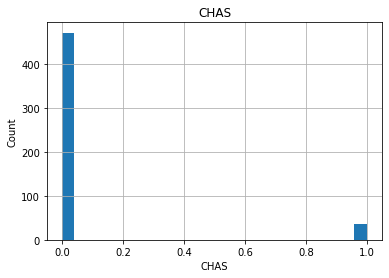

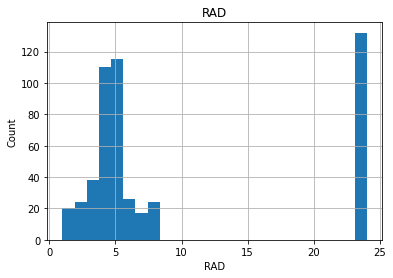

In [13]:
# HISTOGRAM of discrete features

for feature in discrete_feature:
    data=df.copy()  # create a copy to not affect the real dataframe
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

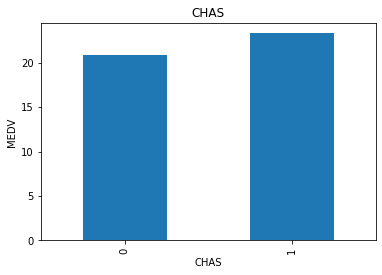

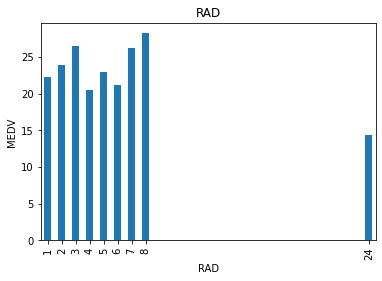

In [15]:
for feature in discrete_feature:
    data=df.copy()
    data.groupby(feature)['MEDV'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('MEDV')
    plt.title(feature)
    plt.show()

In [17]:
df['MEDV'].describe()

count    506.000000
mean      22.532806
std        9.197104
min        5.000000
25%       17.025000
50%       21.200000
75%       25.000000
max       50.000000
Name: MEDV, dtype: float64

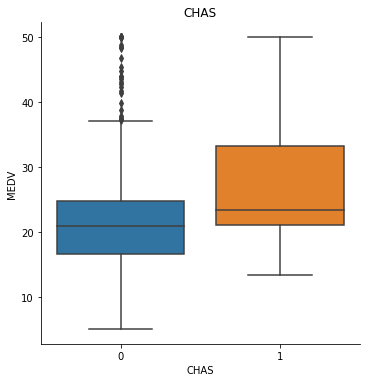

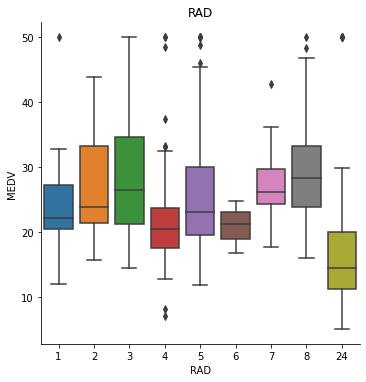

In [19]:
# Boxplot
import seaborn as sns
for feature in discrete_feature:
    data=df.copy()
    sns.catplot(x=feature, y="MEDV", data=df, kind="box")
    plt.title(feature)
    plt.show()

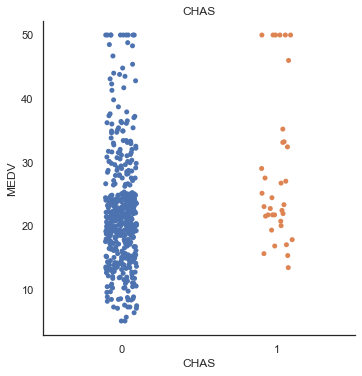

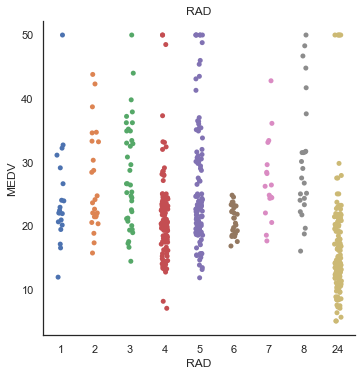

In [20]:
# Catplot
sns.set(style="white")

for feature in discrete_feature:
    data=df.copy()
    sns.catplot(x=feature, y="MEDV", data=df)
    plt.title(feature)
    plt.show()

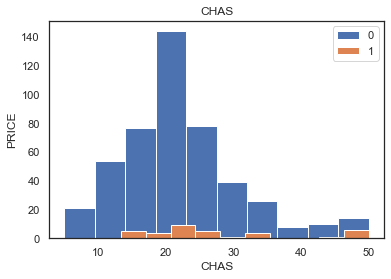

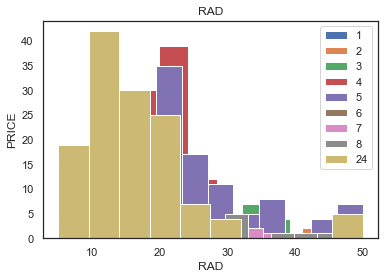

In [21]:
for feature in discrete_feature:
    data=df.copy()
    data.groupby(feature)['MEDV'].plot.hist()
    plt.xlabel(feature)
    plt.ylabel('PRICE')
    plt.title(feature)
    plt.legend()
    plt.show()

It looks like CHAS and RAD do not give useful information about the target variable

# Continious Variable

In [12]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature and 'MEDV']
print("Continuous feature Count {}".format(len(continuous_feature)))
print(continuous_feature)

Continuous feature Count 12
['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']


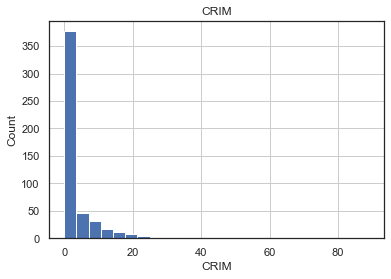

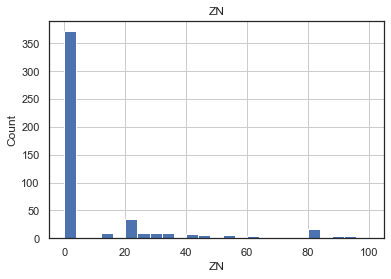

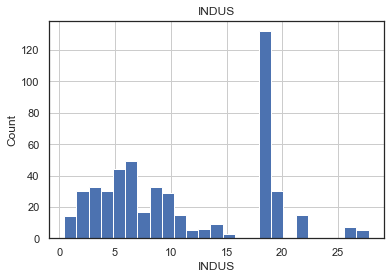

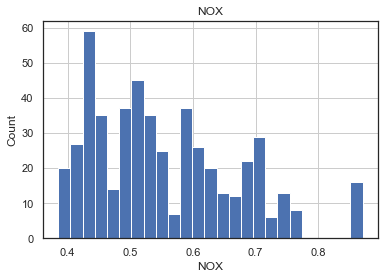

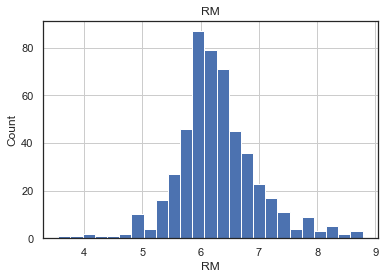

...

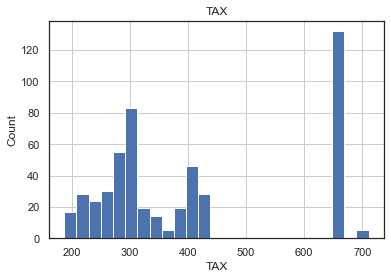

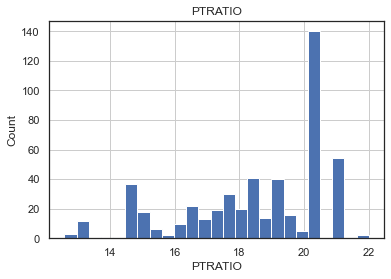

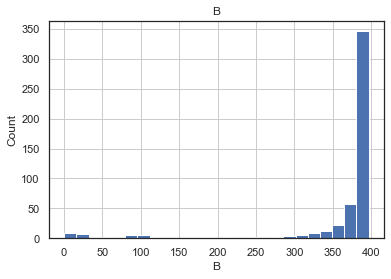

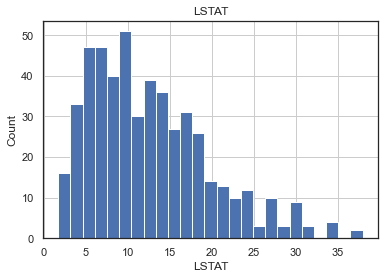

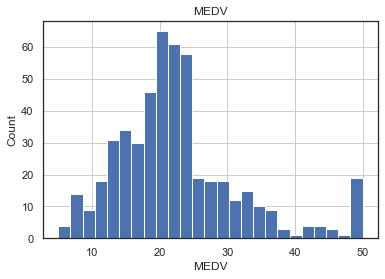

In [23]:
## Lets analyse the continuous values by creating histograms to understand the distribution

for feature in continuous_feature:
    data=df.copy()  # create a copy to not affect the real dataframe
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

CRIM, ZN, INDUS, NOX, AGE, DIS, TAX, PTRATIO B, LSTAT are not normally distributed. Only RM feature follows the Normal Distribution

In [24]:
df['ZN'].value_counts()


0.0      372
20.0      21
80.0      15
12.5      10
25.0      10
22.0      10
40.0       7
30.0       6
45.0       6
90.0       5
95.0       4
21.0       4
60.0       4
33.0       4
28.0       3
52.5       3
75.0       3
34.0       3
35.0       3
70.0       3
55.0       3
82.5       2
85.0       2
17.5       1
100.0      1
18.0       1
Name: ZN, dtype: int64

ZN looks like it has many 0s (same as NAN) so we must replace it with some meaningful values.

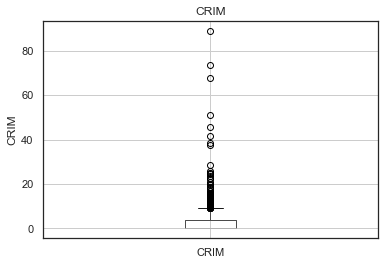

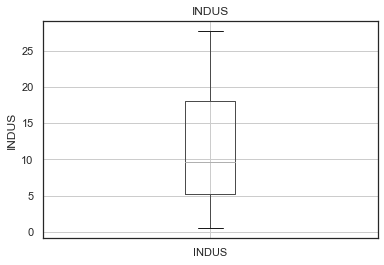

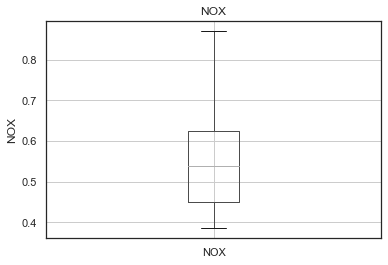

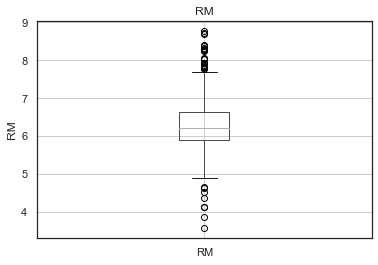

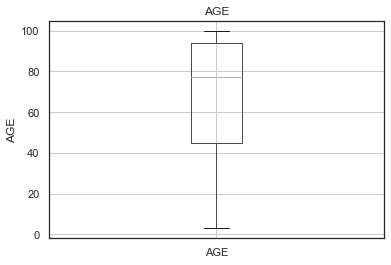

...

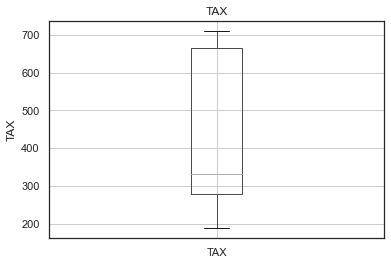

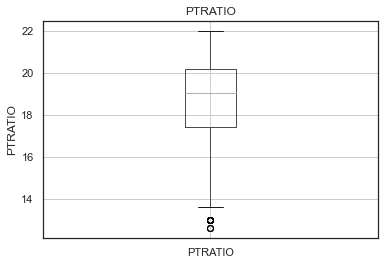

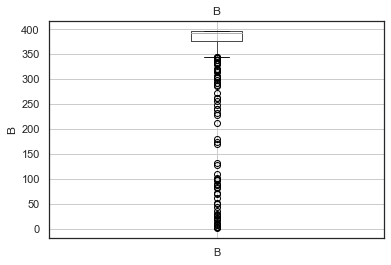

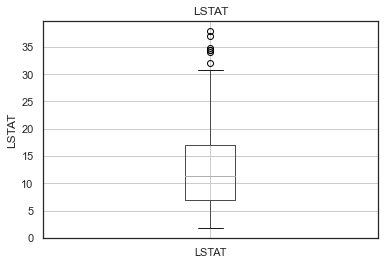

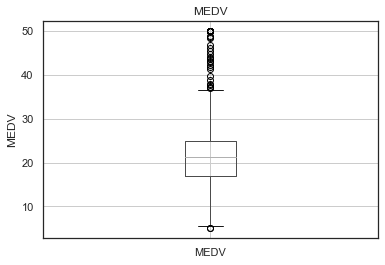

In [25]:
for feature in continuous_feature:
    data=df.copy()
    if 0 in data[feature].unique():
        pass
    else:
        #data[feature]=np.log(data[feature])
        data.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

# Feature Engineering

In [13]:
X = df.drop('MEDV', axis=1)
y = df['MEDV']

Perform train test split before data preprocessing to avoid data leakage

In [14]:
from sklearn.model_selection import train_test_split
# Split the data
X_train, X_test, y_train,y_test = train_test_split(X,y,test_size = 0.20,random_state=45)

In [15]:
X_train['ZN'].value_counts()


0.0      296
20.0      15
80.0      11
22.0      10
12.5       9
25.0       9
40.0       7
30.0       5
45.0       5
90.0       4
52.5       3
55.0       3
60.0       3
28.0       3
95.0       3
33.0       3
21.0       2
75.0       2
34.0       2
35.0       2
70.0       2
85.0       2
82.5       1
100.0      1
18.0       1
Name: ZN, dtype: int64

In [16]:
X_test['ZN'].value_counts()


0.0     76
20.0     6
80.0     4
21.0     2
95.0     1
12.5     1
82.5     1
33.0     1
25.0     1
17.5     1
75.0     1
30.0     1
34.0     1
70.0     1
90.0     1
45.0     1
60.0     1
35.0     1
Name: ZN, dtype: int64

In [17]:
X_train["ZN"] = X_train["ZN"].replace(0, X_train['ZN'].mean())
X_test["ZN"] = X_test["ZN"].replace(0, X_train['ZN'].mean())

C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [18]:
print(X_test['ZN'].value_counts())
print(X_train['ZN'].value_counts())

19.571917    76
20.000000     6
80.000000     4
21.000000     2
30.000000     1
60.000000     1
45.000000     1
90.000000     1
70.000000     1
34.000000     1
75.000000     1
17.500000     1
25.000000     1
33.000000     1
82.500000     1
12.500000     1
95.000000     1
35.000000     1
Name: ZN, dtype: int64
11.295792     296
20.000000      15
80.000000      11
22.000000      10
12.500000       9
25.000000       9
40.000000       7
30.000000       5
45.000000       5
90.000000       4
55.000000       3
52.500000       3
28.000000       3
95.000000       3
33.000000       3
60.000000       3
85.000000       2
21.000000       2
75.000000       2
34.000000       2
35.000000       2
70.000000       2
82.500000       1
100.000000      1
18.000000       1
Name: ZN, dtype: int64


# Multicollinearity

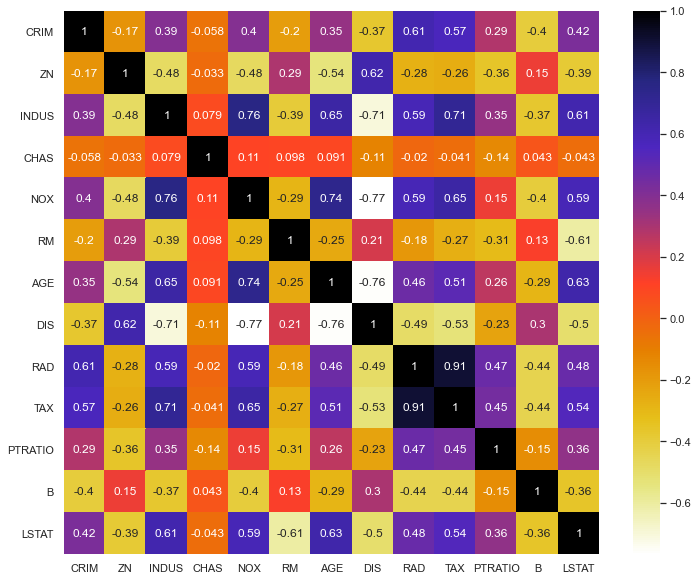

In [34]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()


C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


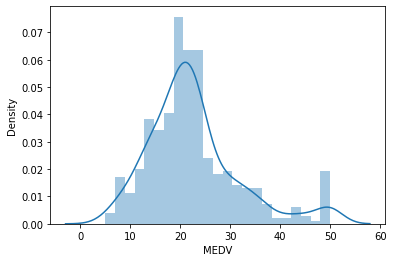

In [29]:
sns.distplot(df.MEDV)
plt.show()

Since RAD and TAX have high co-relation with each other, we are dropping one variable

In [19]:
X_train.drop('RAD', axis=1, inplace=True)
X_test.drop('RAD', axis=1, inplace=True)

C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\pandas\core\frame.py:4312: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [20]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(X_dataset):
    vif = pd.DataFrame()
    vif['Features'] = X_train.columns
    vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
    return vif

calculate_vif(X_train)

,Features,VIF
0,CRIM,1.874141
1,ZN,4.084407
2,INDUS,13.214803
3,CHAS,1.164455
4,NOX,71.069843
5,RM,86.121880
6,AGE,21.958144
7,DIS,14.335523
8,TAX,21.658321
9,PTRATIO,85.840541


# Feature Scaling

In [21]:
from sklearn.preprocessing import StandardScaler
# Standardizing the data (mean=0, sigma=1)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train = pd.DataFrame(data=X_train_scaled, columns=X_train.columns)
X_train.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,TAX,PTRATIO,B,LSTAT
0,-0.362530,0.126595,-0.768242,-0.283221,-1.051356,-0.231056,-1.165853,2.014952,-0.443214,0.326601,0.354199,-0.496762
1,-0.394140,-0.431498,0.421497,-0.283221,-1.000060,0.414571,-0.599966,1.014207,-0.690158,-1.132154,0.384874,-0.749581
2,-0.145922,-0.431498,1.256971,-0.283221,0.436203,0.077850,0.985223,-0.829750,-0.003533,-1.743889,-0.715273,-0.219660
3,0.025248,-0.431498,1.038508,3.530817,1.846819,0.189114,0.805966,-0.636202,1.580522,0.844223,0.367526,0.090294
4,-0.386099,0.283008,-0.875998,-0.283221,-0.863273,0.726404,-0.867093,1.979318,-0.720273,0.608940,0.416237,-0.448197


In [22]:
X_train.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
dtype: object

In [75]:
X_test_scaled = scaler.fit_transform(X_test)
X_test = pd.DataFrame(data=X_test_scaled, columns=X_test.columns)
X_test.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,TAX,PTRATIO,B,LSTAT
0,-0.514844,-0.366941,-0.631122,-0.227038,-0.988545,-1.250810,0.926640,1.049936,-1.099468,-0.327567,0.482046,2.369406
1,-0.551085,-0.481380,-1.404478,-0.227038,-1.276432,0.970363,-0.415147,2.620392,-1.195983,-0.022635,0.447332,-0.610573
2,0.164484,-0.366941,0.933768,-0.227038,0.509548,0.808823,-0.111558,-0.513119,1.358847,0.674352,0.271293,-0.137914
3,0.013987,-0.366941,0.933768,-0.227038,0.229784,-0.061408,-0.699996,0.170165,1.358847,0.674352,0.403512,-0.279319
4,-0.507990,-0.366941,-0.730414,-0.227038,-0.483164,1.728558,-2.008051,-0.118643,-0.679340,-0.545376,0.298135,-1.151316


# Model Training

In [76]:
# Model Performance on TRAINING SET

def model_trainingset_performance(model, X_train, y_train):
    print('Model Performance on TRAINING SET')
    
    pred_train = model.predict(X_train)

    print('R Squared : ', model.score(X_train, y_train))
    print("Adjusted R Squared : ", r2_score(y_train, pred_train))
    print("Mean Squared Error : ", mean_squared_error(y_train, pred_train))
    print('Mean Absolute Error : ', mean_absolute_error(y_train, pred_train))

In [77]:
# Model Performance on TEST SET

def model_testset_performance(model, X_test, y_test):
    print('Model Performance on TEST SET')
    
    pred_test = model.predict(X_test)

    print('R Squared : ', model.score(X_test, y_test))
    print("Adjusted R Squared : ", r2_score(y_test, pred_test))
    print("Mean Squared Error : ", mean_squared_error(y_test, pred_test))
    print('Mean Absolute Error : ', mean_absolute_error(y_test, pred_test))

# 1. Lasso Reagression

In [78]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import Lasso

In [79]:
# alpha=1.0 by default
lasso = Lasso()
lasso.fit(X_train, y_train)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [80]:
# Model Performance on TEST SET

model_testset_performance(lasso, X_test, y_test)

Model Performance on TEST SET
R Squared :  0.6395566147848588
Adjusted R Squared :  0.6395566147848588
Mean Squared Error :  38.95599111037248
Mean Absolute Error :  4.58983845314264


In [81]:
# Model Performance on TRAINING SET

model_trainingset_performance(lasso, X_train, y_train)

Model Performance on TRAINING SET
R Squared :  0.652375833775475
Adjusted R Squared :  0.652375833775475
Mean Squared Error :  27.2328901953592
Mean Absolute Error :  3.5552880851957585


In [82]:
# LassoCV will return best alpha and coefficients after performing 10 cross validations
# alphas -> List of alphas where to compute the models. If None alphas are set automatically.
lasscv = LassoCV(alphas = None,cv =10, max_iter = 100000, normalize = True)
lasscv.fit(X_train, y_train)

LassoCV(alphas=None, copy_X=True, cv=10, eps=0.001, fit_intercept=True,
        max_iter=100000, n_alphas=100, n_jobs=None, normalize=True,
        positive=False, precompute='auto', random_state=None,
        selection='cyclic', tol=0.0001, verbose=False)

In [83]:
# best alpha parameter as a result from Cross Validation
alpha = lasscv.alpha_
alpha

0.004000521477738746

In [84]:
#now that we have best parameter, let's use Lasso regression and see how well our data has fitted before

from sklearn.linear_model import Lasso
lasso_reg = Lasso(alpha=alpha)
lasso_reg.fit(X_train, y_train)

Lasso(alpha=0.004000521477738746, copy_X=True, fit_intercept=True,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [85]:
# Model Performance on TEST SET

model_testset_performance(lasso_reg, X_test, y_test)

Model Performance on TEST SET
R Squared :  0.7224258402196807
Adjusted R Squared :  0.7224258402196807
Mean Squared Error :  29.99965305069218
Mean Absolute Error :  3.93853392349592


In [86]:
# Model Performance on TRAINING SET

model_trainingset_performance(lasso_reg, X_train, y_train)

Model Performance on TRAINING SET
R Squared :  0.7262763004492956
Adjusted R Squared :  0.7262763004492956
Mean Squared Error :  21.443524869664042
Mean Absolute Error :  3.1712139879252934


In [87]:
# Weights for each parameter

print(X_train.columns)
print(lasso_reg.coef_)

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'TAX',
       'PTRATIO', 'B', 'LSTAT'],
      dtype='object')
[-0.67826695  0.81267425 -0.67345349  0.69907326 -1.7547799   2.77814331
  0.13929967 -3.05717293  0.30432611 -1.68316214  0.72766636 -3.6691682 ]


# 2. Ridge Regression

In [88]:
from sklearn.linear_model import Ridge, RidgeCV


In [89]:
# alpha=1.0 by default
ridge = Ridge()
ridge.fit(X_train, y_train)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [90]:
# Model Performance on TEST SET

model_testset_performance(ridge, X_test, y_test)

Model Performance on TEST SET
R Squared :  0.7222653890715942
Adjusted R Squared :  0.7222653890715942
Mean Squared Error :  30.016994285834492
Mean Absolute Error :  3.940471187156182


In [91]:
# Model Performance on TRAINING SET

model_trainingset_performance(ridge, X_train, y_train)

Model Performance on TRAINING SET
R Squared :  0.7262767535359355
Adjusted R Squared :  0.7262767535359355
Mean Squared Error :  21.443489374839707
Mean Absolute Error :  3.1708306106785633


In [92]:
alphas = np.linspace(0,10, 50)
ridgecv = RidgeCV(alphas = alphas,cv=10,normalize = True)
ridgecv.fit(X_train, y_train)

RidgeCV(alphas=array([ 0.        ,  0.20408163,  0.40816327,  0.6122449 ,  0.81632653,
        1.02040816,  1.2244898 ,  1.42857143,  1.63265306,  1.83673469,
        2.04081633,  2.24489796,  2.44897959,  2.65306122,  2.85714286,
        3.06122449,  3.26530612,  3.46938776,  3.67346939,  3.87755102,
        4.08163265,  4.28571429,  4.48979592,  4.69387755,  4.89795918,
        5.10204082,  5.30612245,  5.51020408,  5.71428571,  5.91836735,
        6.12244898,  6.32653061,  6.53061224,  6.73469388,  6.93877551,
        7.14285714,  7.34693878,  7.55102041,  7.75510204,  7.95918367,
        8.16326531,  8.36734694,  8.57142857,  8.7755102 ,  8.97959184,
        9.18367347,  9.3877551 ,  9.59183673,  9.79591837, 10.        ]),
        cv=10, fit_intercept=True, gcv_mode=None, normalize=True, scoring=None,
        store_cv_values=False)

In [93]:
ridgecv.alpha_


0.20408163265306123

In [94]:
ridge_reg = Ridge(alpha=ridgecv.alpha_)
ridge_reg.fit(X_train, y_train)

Ridge(alpha=0.20408163265306123, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [95]:
# Model Performance on TEST SET

model_testset_performance(ridge_reg, X_test, y_test)

Model Performance on TEST SET
R Squared :  0.7223213938363742
Adjusted R Squared :  0.7223213938363742
Mean Squared Error :  30.01094140427696
Mean Absolute Error :  3.9428002523450276


In [96]:
# Model Performance on TRAINING SET

model_trainingset_performance(ridge_reg, X_train, y_train)

Model Performance on TRAINING SET
R Squared :  0.7262831959840426
Adjusted R Squared :  0.7262831959840426
Mean Squared Error :  21.442984673213832
Mean Absolute Error :  3.1735291200725713


# 3. Linear Regression

In [97]:
from sklearn.linear_model import LinearRegression
lg = LinearRegression()
lg.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [98]:
# Model Performance on TEST SET

model_testset_performance(lg, X_test, y_test)

Model Performance on TEST SET
R Squared :  0.7223345973539805
Adjusted R Squared :  0.7223345973539805
Mean Squared Error :  30.009514394833587
Mean Absolute Error :  3.94340796099261


In [99]:
# Model Performance on TRAINING SET

model_trainingset_performance(lg, X_train, y_train)

Model Performance on TRAINING SET
R Squared :  0.7262834809986916
Adjusted R Squared :  0.7262834809986916
Mean Squared Error :  21.442962345155554
Mean Absolute Error :  3.1742288923247264


In [100]:
from sklearn.model_selection import GridSearchCV

param = {'fit_intercept' : [True, False]}

search = GridSearchCV(LinearRegression(), param, scoring='r2')
search.fit(X_train, y_train)

GridSearchCV(cv=None, error_score=nan,
             estimator=LinearRegression(copy_X=True, fit_intercept=True,
                                        n_jobs=None, normalize=False),
             iid='deprecated', n_jobs=None,
             param_grid={'fit_intercept': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='r2', verbose=0)

In [101]:
search.best_params_


{'fit_intercept': True}

# 4. Elastic Net Regression

In [103]:
from sklearn.linear_model import ElasticNetCV, ElasticNet
# alpha = 1.0 by default
elastic_net = ElasticNet()
elastic_net.fit(X_train, y_train)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [104]:
# Model Performance on TEST SET

model_testset_performance(elastic_net, X_test, y_test)

Model Performance on TEST SET
R Squared :  0.6190947124035122
Adjusted R Squared :  0.6190947124035122
Mean Squared Error :  41.167472080659294
Mean Absolute Error :  4.6181654654174435


In [105]:
# Model Performance on TRAINING SET

model_trainingset_performance(elastic_net, X_train, y_train)

Model Performance on TRAINING SET
R Squared :  0.6370453486387782
Adjusted R Squared :  0.6370453486387782
Mean Squared Error :  28.43388097486559
Mean Absolute Error :  3.57922734099743


In [106]:
elasticCV = ElasticNetCV(alphas = None, cv =10)

elasticCV.fit(X_train, y_train)

ElasticNetCV(alphas=None, copy_X=True, cv=10, eps=0.001, fit_intercept=True,
             l1_ratio=0.5, max_iter=1000, n_alphas=100, n_jobs=None,
             normalize=False, positive=False, precompute='auto',
             random_state=None, selection='cyclic', tol=0.0001, verbose=0)

In [107]:
elasticCV.alpha_


0.07464555496978588

In [108]:
# l1_ration gives how close the model is to L1 regularization, below value indicates we are giving equal

elasticCV.l1_ratio

0.5

In [109]:
elastic = ElasticNet(elasticCV.alpha_)
elastic.fit(X_train, y_train)

ElasticNet(alpha=0.07464555496978588, copy_X=True, fit_intercept=True,
           l1_ratio=0.5, max_iter=1000, normalize=False, positive=False,
           precompute=False, random_state=None, selection='cyclic', tol=0.0001,
           warm_start=False)

In [110]:
# Model Performance on TEST SET

model_testset_performance(elastic, X_test, y_test)

Model Performance on TEST SET
R Squared :  0.719689380961962
Adjusted R Squared :  0.719689380961962
Mean Squared Error :  30.295404025436678
Mean Absolute Error :  3.9018332851597313


In [111]:
# Model Performance on TRAINING SET

model_trainingset_performance(elastic, X_train, y_train)

Model Performance on TRAINING SET
R Squared :  0.7237183666421436
Adjusted R Squared :  0.7237183666421436
Mean Squared Error :  21.643913499872713
Mean Absolute Error :  3.1364646085133048


. All models give similar accuracy on test set. Elastic Net has the lowest mean absolute error.

In [112]:
import pickle
pickle.dump(elastic, open('elastic_net.pickle', 'wb'))

In [1]:
import pickle
loaded_model = pickle.load(open('elastic_net.pickle', 'rb'))